In [83]:
import Pkg; Pkg.activate("../scripts")
Pkg.instantiate()
using Revise
using PlutoUI
using TMI
using Test
using PythonCall
using CondaPkg
using PythonPlot
using NCDatasets
using GH19
const sns = pyimport("seaborn")

const cartopy = pyimport("cartopy")
const matplotlib = pyimport("matplotlib")

ccrs = cartopy.crs

import Pkg;
using Interpolations
using Statistics
using LinearAlgebra
plotsdir(x) = "/Users/anthonymeza/Library/CloudStorage/OneDrive-MassachusettsInstituteofTechnology/Documents/GitHub/TMI.jl/plots/" * x
include("../src/sample_observations.jl")

using NaNStatistics

const mpl = pyimport("matplotlib")
mpl.rcParams["figure.dpi"] = 200


┌ Error: Failed to revise /Users/anthonymeza/.julia/packages/StatsFuns/gSNRw/src/StatsFuns.jl
│   exception = Revise.ReviseEvalException("/Users/anthonymeza/.julia/packages/StatsFuns/gSNRw/src/StatsFuns.jl:285", SystemError("opening file \"/Users/anthonymeza/Library/CloudStorage/OneDrive-MassachusettsInstituteofTechnology/Documents/GitHub/TMI.jl/scripts_observations/distrs/signrank.jl\"", 2, nothing), Any[(_include_dependency(mod::Module, _path::String; track_content::Bool, path_may_be_dir::Bool) at loading.jl:2168, 1), (_include_dependency at loading.jl:2158 [inlined], 1), (_include(mapexpr::Function, mod::Module, _path::String) at loading.jl:2786, 1), (include(mod::Module, _path::String) at Base.jl:557, 1), (include(x::String) at StatsFuns.jl:1, 1), (top-level scope at StatsFuns.jl:285, 1)])
└ @ Revise /Users/anthonymeza/.julia/packages/Revise/W4D4d/src/packagedef.jl:722
┌ Warning: The running code does not match the saved version for the following files:
│ 
│   /Users/anthonymeza/.j

200

In [84]:
custom_style = Dict("text.color" => "black")

Dict{String, String} with 1 entry:
  "text.color" => "black"

In [85]:
sns.set_theme(context="notebook", style="ticks", palette = "colorblind", rc=custom_style)

Python: None

In [86]:
# Configure PI dataset
TMIversion_PI = "modern_180x90x33_GH11_GH12"
A_PI, Alu_PI, γ_PI, TMIfile_PI, L_PI, B_PI = config_from_nc(TMIversion_PI)

A
  0.062706 seconds (5.25 k allocations: 118.948 MiB)
Alu
  7.749856 seconds (2.57 k allocations: 2.810 GiB, 5.84% gc time, 0.16% compilation time)
L=
  0.178000 seconds (8.14 M allocations: 224.496 MiB)
B=
  0.017506 seconds (5.98 k allocations: 7.247 MiB)


(sparse([1, 238661, 238662, 2, 3, 4, 85163, 95731, 125089, 125447  …  291155, 290427, 291110, 291146, 291154, 291155, 290431, 291149, 291150, 291156], [1, 1, 1, 2, 3, 4, 4, 4, 4, 4  …  291154, 291155, 291155, 291155, 291155, 291155, 291156, 291156, 291156, 291156], [1.0, 0.016843730906806346, 0.017693086825606164, 1.0, 1.0, 1.0, 0.04196705173869461, 0.492267485852254, 0.22160620943716153, 0.07549178972517126  …  0.33952207673716894, 0.23515310318441046, 0.08729536886723051, 0.1992262903431205, 0.25364488117953465, -1.0, 0.2125741686383178, 0.33503459888743925, 0.2720416787434391, -1.0], 291156, 291156), SparseArrays.UMFPACK.UmfpackLU{Float64, Int64}(SparseArrays.UMFPACK.Symbolic{Float64, Int64}(Ptr{Nothing} @0x000000011ec61870), SparseArrays.UMFPACK.Numeric{Float64, Int64}(Ptr{Nothing} @0x0000000384f70a80), 291156, 291156, [0, 3, 4, 5, 17, 19, 21, 23, 25, 26  …  1628131, 1628135, 1628139, 1628144, 1628149, 1628154, 1628157, 1628162, 1628167, 1628171], [0, 238660, 238661, 1, 2, 3, 85162

In [101]:
function volume_average(variable, mask::AbstractArray, γ::TMI.Grid)
    weighted_volume = mask .* volume
    averaged_variable = sum(replace(variable, NaN=>0.0) .* weighted_volume, dims = [1, 2, 3]) ./ sum(weighted_volume, dims = [1, 2, 3])
    return averaged_variable
end
function extract_timeseries(file::String, tracername::String, mask::AbstractArray, γ::TMI.Grid)
    # fname = "../GH19.jl/data/Theta_OPT-0015.nc"
    # fname = 
    dataset = NCDataset(file, "r")
    volume = cellvolume(γ).tracer
    variable = permutedims(dataset[tracername][:, :, :, :], (4, 3, 2, 1)) #lon, lat, time, depth
    
    weighted_volume = mask .* volume
    timeseries = vec(sum(replace(variable, NaN=>0.0) .* weighted_volume, dims = [1, 2, 3]) ./ sum(weighted_volume, dims = [1, 2, 3]))
    
    return reverse(dataset["year"][:]), reverse(timeseries)
end

extract_timeseries (generic function with 1 method)

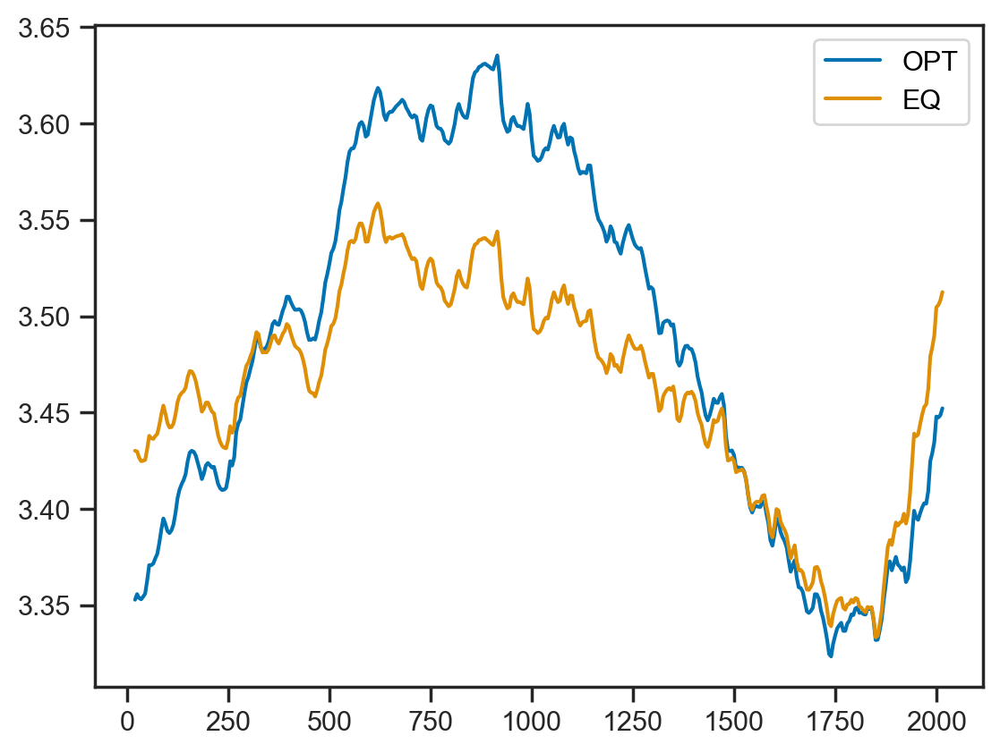

In [88]:
mask = 1 .* γ_PI.wet
yearsOPT, OPT15 = extract_timeseries("../../GH19.jl/data/Theta_OPT-0015.nc", "theta", mask, γ_PI)
yearEQ, EQ15 = extract_timeseries("../../GH19.jl/data/Theta_EQ-0015.nc", "theta", mask, γ_PI)

fig, ax = subplots()
ax.plot(years, OPT15, label = "OPT")
ax.plot(years, EQ15, label = "EQ")
ax.legend()
fig

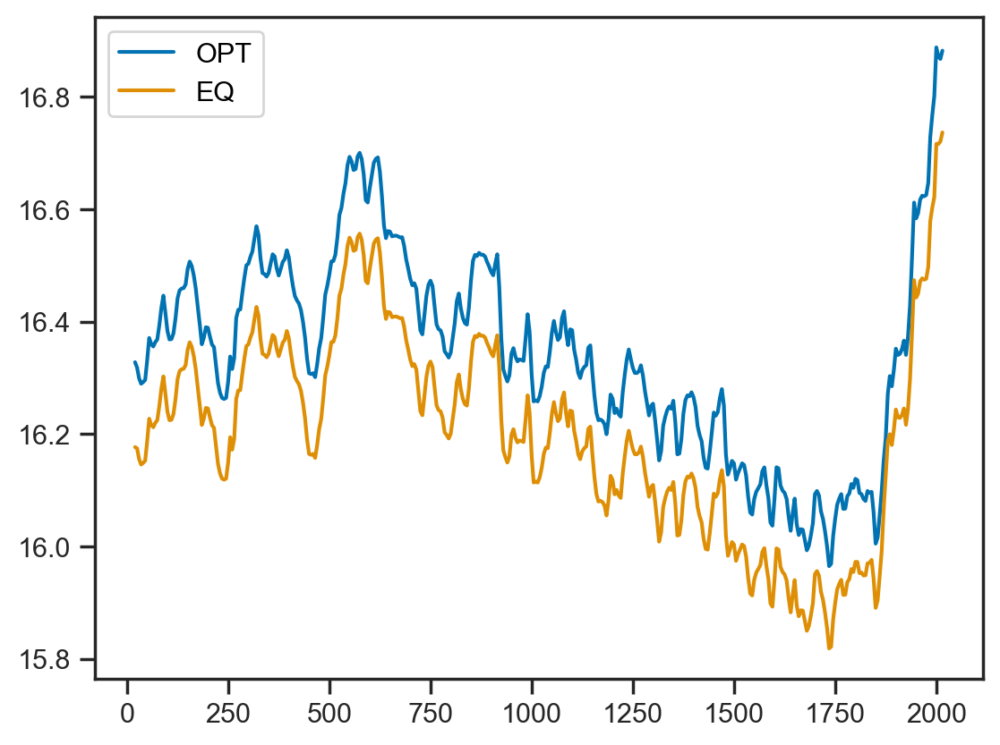

In [89]:
mask = 1 .* γ_PI.wet
mask[:, :, 2:end] .= 0

yearsOPT, OPT15 = extract_timeseries("../../GH19.jl/data/Theta_OPT-0015.nc", "theta", mask, γ_PI)
yearEQ, EQ15 = extract_timeseries("../../GH19.jl/data/Theta_EQ-0015.nc", "theta", mask, γ_PI)

fig, ax = subplots()
ax.plot(years, OPT15, label = "OPT")
ax.plot(years, EQ15, label = "EQ")
ax.legend()
fig


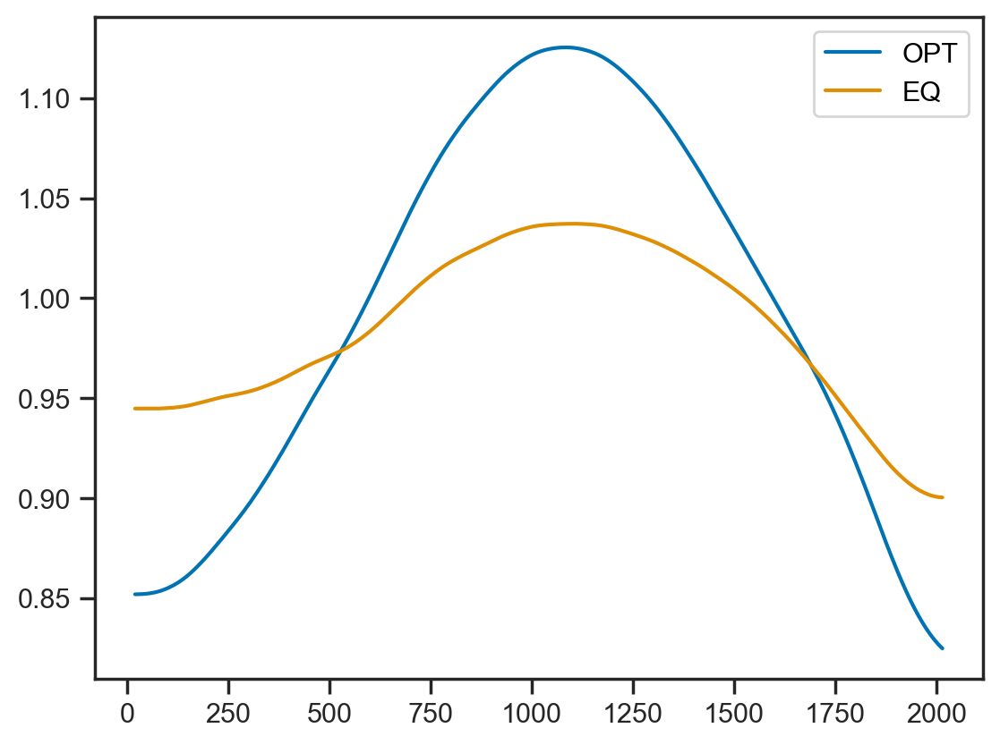

In [90]:
mask = 1 .* γ_PI.wet
mask[:, :, 1:30] .= 0

yearsOPT, OPT15 = extract_timeseries("../../GH19.jl/data/Theta_OPT-0015.nc", "theta", mask, γ_PI)
yearEQ, EQ15 = extract_timeseries("../../GH19.jl/data/Theta_EQ-0015.nc", "theta", mask, γ_PI)

fig, ax = subplots()
ax.plot(yearsOPT, OPT15, label = "OPT")
ax.plot(yearEQ, EQ15, label = "EQ")
ax.legend()
fig


In [107]:
OPT15_20 = GH19.readfield_snapshot("../../GH19.jl/data/Theta_OPT-0015.nc", "theta", 1, γ_PI) 
EQ15_20 = GH19.readfield_snapshot("../../GH19.jl/data/Theta_EQ-0015.nc", "theta", 1, γ_PI) 

mask = 1 .* γ_PI.wet

println("OPT15")
OPT15_20_filled = steadyinversion(Alu_PI,getsurfaceboundary(OPT15_20),γ_PI)

println(volume_average(OPT15_20_filled.tracer, mask, γ_PI)[1])

println(extract_timeseries("../../GH19.jl/data/Theta_OPT-0015.nc", "theta", mask, γ_PI)[2][1])

mask = 1 .* γ_PI.wet

println("EQ15")

EQ15_20_filled = steadyinversion(Alu_PI,getsurfaceboundary(EQ15_20),γ_PI)

println(volume_average(EQ15_20_filled.tracer, mask, γ_PI)[1])

println(extract_timeseries("../../GH19.jl/data/Theta_EQ-0015.nc", "theta", mask, γ_PI)[2][1])

OPT15
3.59037744821069
3.3528459892486806
EQ15
0.30683254051075515
3.4301644685339943


In [114]:
NaNStatistics.nansum(getsurfaceboundary(OPT15_20).tracer)

139009.30545238877

In [115]:
NaNStatistics.nansum(getsurfaceboundary(EQ15_20).tracer)

137720.13517967047

In [119]:
TMIversion = "LGM_90x45x33_G14";
A, Alu, γ, TMIfile, L, B = config_from_nc(TMIversion);

A
  0.044632 seconds (4.36 k allocations: 34.891 MiB)
Alu
  5.086679 seconds (88 allocations: 477.426 MiB, 0.71% gc time)
L=
  0.012665 seconds (614 allocations: 40.633 KiB)
B=
  0.009218 seconds (615 allocations: 40.656 KiB)


In [ ]:
function sum_pairs(v)
    n = length(v)
    return [v[i] + v[i+1] for i in 1:2:n-1]
end

function avg_pairs(v)
    n = length(v)
    return [((v[i] + v[i+1]) / 2) for i in 1:2:n-1]
end

avg_pairs (generic function with 1 method)

In [257]:
function coarsen_boundary_condition(x::AbstractArray, γ::Grid;  method = "sum")
    if method == "sum"
        x_coarse = mapslices(sum_pairs, replace(x, NaN => 0.0), dims=2)
        x_coarse = mapslices(sum_pairs, x_coarse, dims=1)
        return x_coarse
    elseif method == "mean"
        # area = cellarea(γ)
        # wet_area = area.tracer .* γ.wet[:, :, 1]
        volume = volumefilled(TMIversion_PI,Alu_PI,γ);
        wet_area = (10 .^ volume.tracer) .* cellarea(γ).tracer;
        wet_area = replace(wet_area, NaN => 0.0)
        
        x_coarse = mapslices(sum_pairs, replace(x, NaN => 0.0) .* wet_area, dims=2)
        x_coarse = mapslices(sum_pairs, x_coarse, dims=1)

        weight_coarse = mapslices(sum_pairs, wet_area, dims=2)
        weight_coarse = mapslices(sum_pairs, weight_coarse, dims=1)
        weight_coarse[iszero.(weight_coarse)] .= NaN

        return x_coarse ./ weight_coarse
    end
end

coarsen_boundary_condition (generic function with 2 methods)

In [258]:
# Configure PI dataset
TMIversion_PI = "modern_180x90x33_GH11_GH12"
A_PI, Alu_PI, γ_PI, TMIfile_PI, L_PI, B_PI = config_from_nc(TMIversion_PI)

volume = volumefilled(TMIversion_PI,Alu_PI,γ_PI); println(maximum(volume))
volume = (10 .^ volume.tracer) .* cellarea(γ_PI).tracer;

A
  0.081724 seconds (5.25 k allocations: 118.948 MiB)
Alu
  5.125439 seconds (90 allocations: 2.810 GiB, 1.82% gc time)
L=
  0.132983 seconds (8.14 M allocations: 232.558 MiB)
B=
  0.013555 seconds (5.98 k allocations: 7.247 MiB)
6.564797748153216


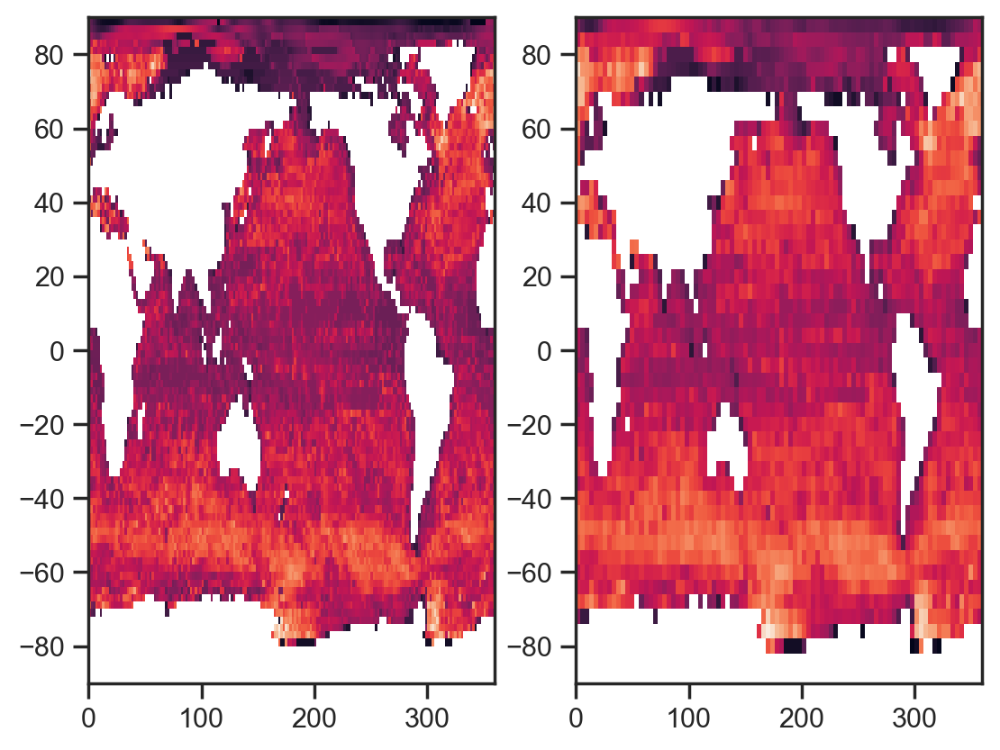

In [259]:
coarsened_volume = coarsen_boundary_condition(replace(volume, NaN => 0.0), γ_PI; method = "sum")
fig, ax = subplots(1, 2)
ax[0].pcolormesh(γ_PI.lon, γ_PI.lat, 
                log.(volume)')

ax[1].pcolormesh(avg_pairs(γ_PI.lon), avg_pairs(γ_PI.lat), 
                log.(coarsened_volume)')
fig

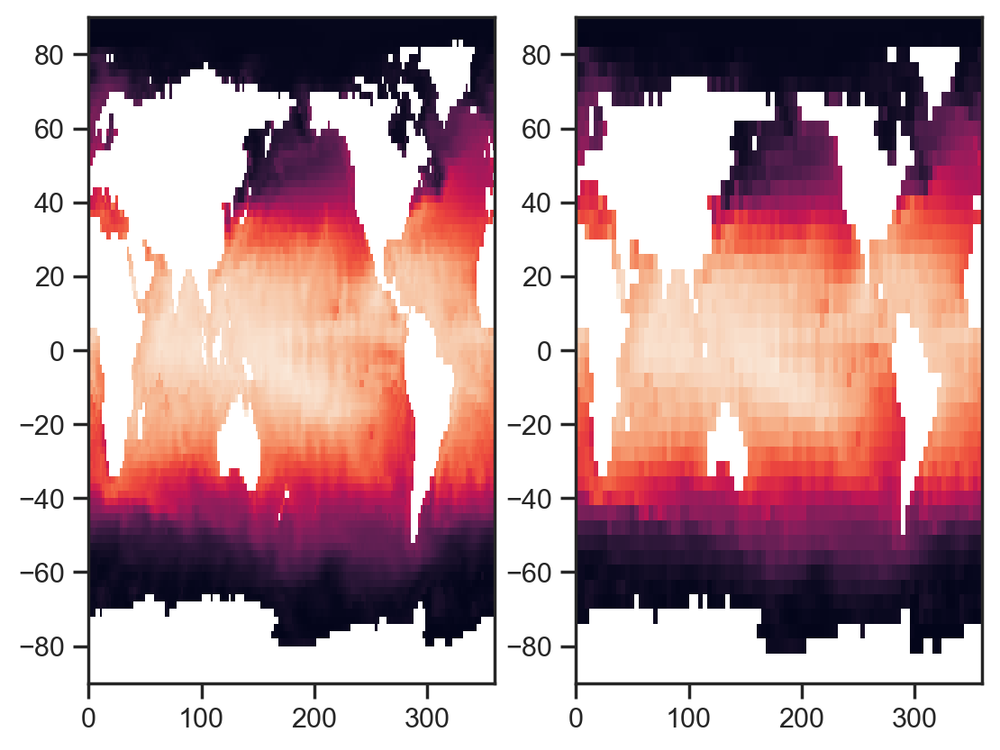

In [260]:
θ_bc = getsurfaceboundary(OPT15_20).tracer
coarsened_θ_bc = coarsen_boundary_condition(θ_bc, γ_PI; method = "mean")

fig, ax = subplots(1, 2)
ax[0].pcolormesh(γ_PI.lon, γ_PI.lat, 
                    θ_bc', vmin = -2, vmax = 30)

ax[1].pcolormesh(avg_pairs(γ_PI.lon), avg_pairs(γ_PI.lat), 
                coarsened_θ_bc', vmin = -2, vmax = 30)
fig

In [261]:
sum(replace(coarsened_θ_bc .* coarsened_volume, NaN=>0.0)) ./ sum(cellvolume(γ_PI))

3.590377448210691

In [262]:
NaNStatistics.nansum(θ_bc .* volume) ./ sum(cellvolume(γ_PI))

3.5903774482106914

A
  0.061099 seconds (5.24 k allocations: 118.947 MiB)
Alu
  5.255259 seconds (88 allocations: 2.810 GiB, 3.21% gc time)
L=
  0.125298 seconds (8.14 M allocations: 232.558 MiB)
B=
  0.015517 seconds (5.98 k allocations: 7.247 MiB)
A
  0.025598 seconds (4.58 k allocations: 34.901 MiB)
Alu
  0.681477 seconds (87 allocations: 492.957 MiB)
L=
  0.002762 seconds (644 allocations: 42.664 KiB)
B=
  0.003961 seconds (645 allocations: 42.688 KiB)


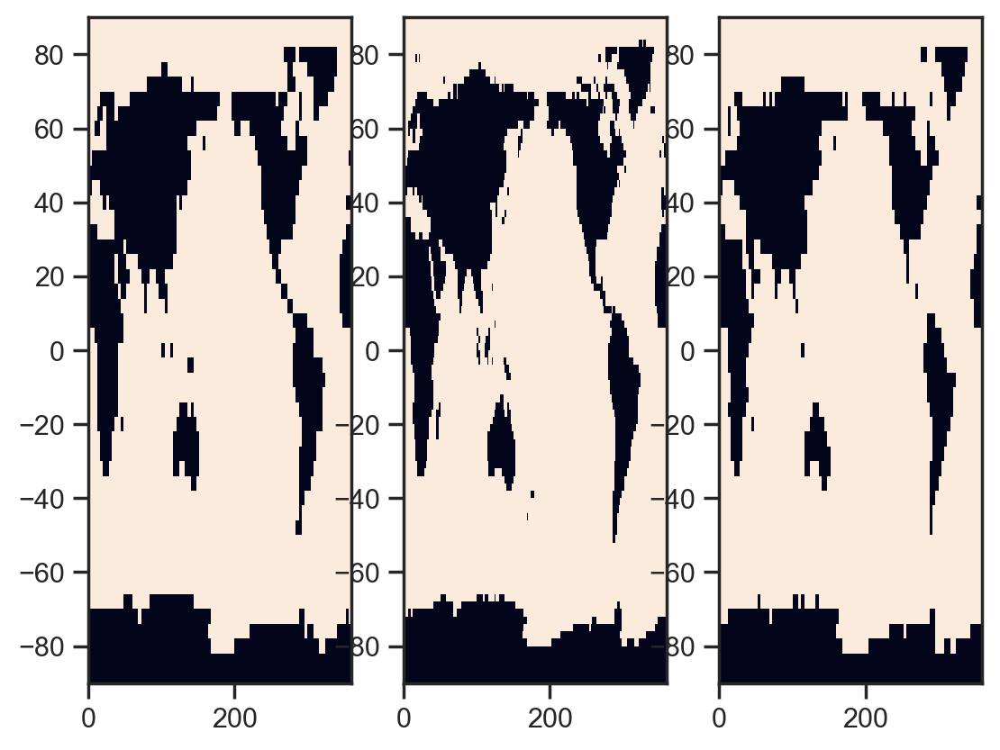

In [263]:
# Configure PI dataset
TMIversion_PI = "modern_180x90x33_GH11_GH12"
A_PI, Alu_PI, γ_PI, TMIfile_PI, L_PI, B_PI = config_from_nc(TMIversion_PI)

# Configure PI dataset
TMIversion_PI_coarse = "modern_90x45x33_G14_v2"
A_PI_coarse, Alu_PI_coarse, γ_PI_coarse, TMIfile_PI_coarse, L_PI_coarse, B_PI_coarse = config_from_nc(TMIversion_PI_coarse)


fig, ax = subplots(1, 3)
ax[0].pcolormesh(γ_PI_coarse.lon, γ_PI_coarse.lat, 
                    γ_PI_coarse.wet[:, :, 1]', vmin = 0, vmax = 1)

ax[1].pcolormesh(γ_PI.lon, γ_PI.lat, 
                γ_PI.wet[:, :, 1]', vmin = 0, vmax = 1)

ax[2].pcolormesh(avg_pairs(γ_PI.lon), avg_pairs(γ_PI.lat), 
                (coarsen_boundary_condition(γ_PI.wet[:, :, 1], γ_PI) .> 0)', 
                vmin = 0, vmax = 1)
fig